## Notebook, Group 12
#### Text Mining, NOVAIMS, 2023-24

- Ayotunde Aribo, 20221012
- Ehis Jegbefumwen, 20221015
- Oseias Beu, 20230524
- Lizaveta Barysionak, 20220667


# **0. Notebook initialization**

***Install Packages***

In [2]:
!pip install pyspellchecker
!pip install langdetect
#!pip install googletrans==4.0.0-rc1
!python -m pip install emoji --upgrade

!pip install pyarrow
!pip install fastparquet
!pip install joblib


In [3]:
!pip install wordcloud

***Import Packages***

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import string
from nltk import pos_tag
from nltk import wordnet
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer, PorterStemmer
from wordcloud import WordCloud
from tqdm import tqdm
from collections import Counter
from spellchecker import SpellChecker
from gensim.test.utils import common_texts
from gensim.models import Word2Vec
import seaborn as sns
from langdetect import detect
from transformers import RobertaTokenizer, RobertaModel
import torch
from langdetect import detect, DetectorFactory
from langdetect.lang_detect_exception import LangDetectException
import nltk
nltk.download('punkt')
import plotly.express as px
import emoji

import pyarrow
import fastparquet

import nltk
import joblib

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from keras.models import Model
from keras.layers import Input, Masking, Bidirectional, LSTM, Dropout, Dense
from keras.optimizers import Adam
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report



# Not actually used:
#from googletrans import Translator


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


## Initialize variables
<ul>Control what is executed<br>Define the data folder



In [5]:

dicSteps2Perform = {}
dicSteps2Perform['01. Raw Exploration'] = True
dicSteps2Perform['02. Raw Processing'] = True
dicSteps2Perform['03. Language detection'] = True
dicSteps2Perform['04. Language translation'] = False
dicSteps2Perform['04B. Actual translation'] = False
dicSteps2Perform['05. Further exploration'] = True
dicSteps2Perform['06. Language-specific processing'] = True
dicSteps2Perform['07. Representation'] = True
dicSteps2Perform['08. Models'] = False


varUseColab=True
if varUseColab:
	from google.colab import drive
	drive.mount('/content/drive')
	varPath = '/content/drive/MyDrive/Text Mining Dataset/Project Corpora/'
else:
	varPath = r'C:\Users\Funskill\Downloads\Compressed\Project Corpora\\'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
"C:\Users\Funskill\Downloads\Compressed\Project Corpora\train_reviews.xlsx"

# **1. Raw Data Exploration**



***Exploratory Data Analysis***

In [ ]:
if dicSteps2Perform['01. Raw Exploration']:

	# Access train file
	train_df = pd.read_excel(varPath + 'train.xlsx')

	# Access train review file
	train_reviews_df = pd.read_excel(varPath + 'train_reviews.xlsx')

	# Access test file
	test_df = pd.read_excel(varPath + 'test.xlsx')

	# Access test reviews file
	test_reviews_df = pd.read_excel(varPath + 'test_reviews.xlsx')


> Train data:
   index                                        description  \
0      1  This is a shared mixed room in our hostel, wit...   
1      2  O meu espaço fica perto de Parque Eduardo VII,...   
2      3  Trafaria’s House is a cozy and familiar villa ...   
3      4  Apartamento Charmoso no Chiado, Entre o Largo ...   
4      5  Joli appartement  en bordure de mer.<br /> 2 m...   

                                          host_about  unlisted  
0                Alojamento Local Registro: 20835/AL         0  
1  I am friendly host, and I will try to always b...         1  
2  I am a social person liking to communicate, re...         1  
3  Hello!_x000D_\nI m Portuguese and i love to me...         0  
4  Nous sommes une famille avec deux enfants de 1...         0  
Train_reviews data:
   index                                           comments
0      1  this is a very cozy and comfortable house to s...
1      1                                          good<br/>
2      1  My firs

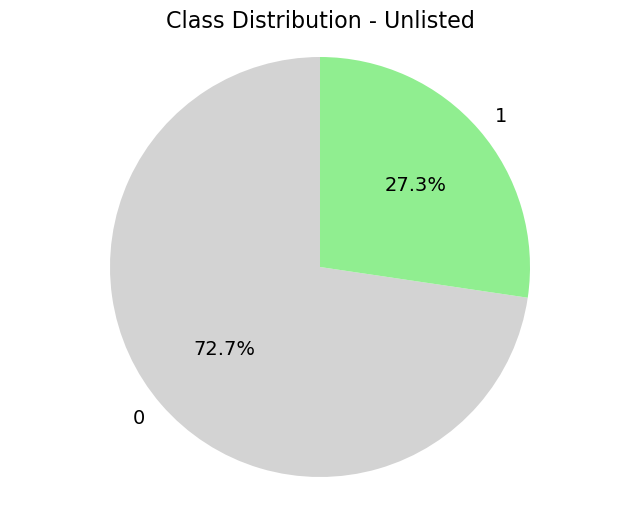

In [ ]:
if dicSteps2Perform['01. Raw Exploration']:
	print("> Train data:")
	print( train_df.head(5))
	print("Train_reviews data:")
	print( train_reviews_df.head(5))
	print("Train dataset shape:", train_df.shape)
	print("Train dataset columns:", train_df.columns)
	print("Train review dataset shape:", train_reviews_df.shape)
	print("Train review dataset columns:", train_reviews_df.columns)

	print("> Check for Nulls - train_df:")
	#check for null values in train df
	print(train_df.isnull().sum())

	print("> Check for Nulls - train_reviews_df:")
	#check for null values in train review df
	print(train_reviews_df.isnull().sum())

	print("> Reviews with NULL values in coments:")

	#Getting the record where 'comments' is null
	print(train_reviews_df[train_reviews_df['comments'].isna() == True])


	# Train dataset
	description = train_df["description"]
	host_about = train_df["host_about"]

	# Print sample descriptions
	print("Sample descriptions:")
	print(description.head())

	# Print sample host_about
	print("Sample host_about:")
	print(host_about.head())

	print("Train Reviews dataset columns:", train_reviews_df.columns)

	print(train_df.info())

	train_reviews_df.info()

	# Checking the distribution of target variable
	print("Distribution of the target variable in the Train dataset:")
	print(train_df["unlisted"].value_counts())

	# Calculate the distribution of the target variable
	unlisted_counts = train_df['unlisted'].value_counts()

	# Define the labels and colors
	labels = ['0', '1']
	colors = ['lightgrey', 'lightgreen']

	# Create the pie chart
	plt.figure(figsize=(8, 6))
	plt.pie(unlisted_counts, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90 , textprops={'fontsize': 14})

	# Equal aspect ratio ensures that pie is drawn as a circle.
	plt.title('Class Distribution - Unlisted', fontsize=16)
	plt.axis('equal')





# **2. Raw processing**



In [ ]:
#if not dicSteps2Perform['01. Raw Exploration'] and dicSteps2Perform['02. Raw Processing']:
if dicSteps2Perform['02. Raw Processing']:

	# Access train file
	train_df = pd.read_excel(varPath + 'train.xlsx')
	# Access train review file
	train_reviews_df = pd.read_excel(varPath + 'train_reviews.xlsx')
	# Access test file
	test_df = pd.read_excel(varPath + 'test.xlsx')
	# Access test reviews file
	test_reviews_df = pd.read_excel(varPath + 'test_reviews.xlsx')


In [ ]:

def add_numeric_cols(df, col_name):
	'''Receives a dataframe and a column name and adds new columns for length and word count for the given column'''
	# Add new columns or length and word count for a given dataframe and column
	print("Calculating length for", col_name)
	df[col_name + '_length'] = df[col_name].apply(len)
	print("Calculating word count for", col_name)
	df[col_name + '_word_count'] = df[col_name].apply(lambda x: len(nltk.word_tokenize(x)))


In [ ]:

# Remove HTML Tags
def remove_html_tags(comments):
    '''Receives a string and returns it without HTML tags'''
    cleaned_comments = []
    for comment in comments:
        cleaned_comment = re.sub('<[^<]+?>', '', comment)
        cleaned_comments.append(cleaned_comment)
    return cleaned_comments

# Lowercasing

def lowercase(column):
    '''Receives a column and returns it with all text in lowercase'''
    # Apply lowercasing directly to the string
    column = column.apply(lambda x: x.lower())
    return column

# clean text
def clean_text(column):
    '''Receives a column and invokes the functions to clean the text'''
    column = lowercase(column)
    column = remove_html_tags(column)
    return column


***Drop null values***

In [ ]:
#if not dicSteps2Perform['01. Raw Exploration'] and dicSteps2Perform['02. Raw Processing']:
if dicSteps2Perform['02. Raw Processing']:

	# Dropping reviews with null values
	print(f"Dataset train_reviews shape before dropping null value : {train_reviews_df.shape}")
	train_reviews_df.dropna(inplace=True)
	print(f"Dataset train_reviews shape after dropping null value : {train_reviews_df.shape}")

	# Dropping properties with null values
	print(f"Dataset train shape before dropping null value : {train_df.shape}")
	train_df.dropna(inplace=True)
	print(f"Dataset train shape after dropping null value : {train_df.shape}")


Dataset train_reviews shape before dropping null value : (361281, 2)
Dataset train_reviews shape after dropping null value : (361281, 2)
Dataset train shape before dropping null value : (6248, 4)
Dataset train shape after dropping null value : (6248, 4)


***Add columns with length and word count***

In [ ]:
if dicSteps2Perform['02. Raw Processing']:

	add_numeric_cols(train_df, 'description')
	add_numeric_cols(train_df, 'host_about')
	add_numeric_cols(train_reviews_df, 'comments')
	add_numeric_cols(test_df, 'description')
	add_numeric_cols(test_df, 'host_about')
	add_numeric_cols(test_reviews_df, 'comments')


# 1'44''


Calculating length for description
Calculating word count for description
Calculating length for host_about
Calculating word count for host_about
Calculating length for comments
Calculating word count for comments
Calculating length for description
Calculating word count for description
Calculating length for host_about
Calculating word count for host_about
Calculating length for comments
Calculating word count for comments


***Remove HTML and convert to lowercase***


In [ ]:
if dicSteps2Perform['02. Raw Processing']:
	train_df["description"] = clean_text(train_df['description'])
	train_df["host_about"] = clean_text(train_df['host_about'])
	train_reviews_df["comments"] = clean_text(train_reviews_df['comments'])
	test_df["description"] = clean_text(test_df['description'])
	test_df["host_about"] = clean_text(test_df['host_about'])
	test_reviews_df["comments"] = clean_text(test_reviews_df['comments'])

# train_df_new['comments'] = remove_html_tags(train_df_new['comments'])
# train_df_new['comments'] = lowercase(train_df_new['comments'])


In [ ]:
train_df

,index,description,host_about,unlisted,description_length,description_word_count,host_about_length,host_about_word_count
0,1,"this is a shared mixed room in our hostel, wit...",alojamento local registro: 20835/al,0,729,181,35,5
1,2,"o meu espaço fica perto de parque eduardo vii,...","i am friendly host, and i will try to always b...",1,138,29,123,28
2,3,trafaria’s house is a cozy and familiar villa ...,"i am a social person liking to communicate, re...",1,1000,213,235,50
3,4,"apartamento charmoso no chiado, entre o largo ...",hello!_x000d_\ni m portuguese and i love to me...,0,272,69,162,36
4,5,joli appartement en bordure de mer. 2 min. a ...,nous sommes une famille avec deux enfants de 1...,0,659,169,224,38
...,...,...,...,...,...,...,...,...
6243,6244,"studio 15 is a new, very well decorated and co...",i'm a brand manager from lisbon in portugal bu...,0,1000,263,352,75
6244,6245,lisbon meets a cosmopolitan industrial one-bed...,home is where feelings are visitors. how do we...,0,1000,221,2047,389
6245,6246,license numberexempt,i am a travel agent passionate by cultures. \n...,1,33,13,179,37
6246,6247,campo pequeno prestige is a classy and top qua...,família_x000d_\nportugal_x000d_\ngavião_x000d_...,0,1000,220,68,5


In [ ]:
if dicSteps2Perform['02. Raw Processing']:

	prefix = varPath + 'rawproc_'
	train_df.to_parquet(prefix + 'train.parquet')
	train_reviews_df.to_parquet(prefix + 'train_reviews.parquet')
	test_df.to_parquet( prefix + 'test.parquet')
	test_reviews_df.to_parquet( prefix + 'test_reviews.parquet')


# **03 - Language Detection**


In [ ]:
if dicSteps2Perform['03. Language detection']:
	prefix = varPath + 'rawproc_'
	train_df = pd.read_parquet(prefix + 'train.parquet')
	train_reviews_df = pd.read_parquet(prefix + 'train_reviews.parquet')
	test_df = pd.read_parquet(prefix + 'test.parquet')
	test_reviews_df = pd.read_parquet(prefix + 'test_reviews.parquet')


In [ ]:
# Function to detect host_about languages
def detect_language(text):
    try:
        return detect(text)
    except LangDetectException:
        return None


In [ ]:
# Create new columns for the language of the description, host_about and comments
if dicSteps2Perform['03. Language detection']:

	print("Detecting language for description, host_about and comments in train and test datasets")
	## train_df['description_language'] = train_df['description'].apply(lambda x: detect(x) if isinstance(x, str) else None)
	print("Detecting language for description train dataset", pd.Timestamp.now().time())
	train_df['description_lang'] = train_df['description'].apply(detect_language)
	print("Detecting language for host_about in train dataset", pd.Timestamp.now().time())
	train_df['host_about_lang']  = train_df['host_about'].apply(detect_language)
	print("Detecting language for comments in train dataset", pd.Timestamp.now().time())
	train_reviews_df['comments_lang'] = train_reviews_df['comments'].apply(detect_language)

	print("Detecting language for description in the test dataset", pd.Timestamp.now().time())
	test_df['description_lang'] = test_df['description'].apply(detect_language)
	print("Detecting language for host_about in the test dataset", pd.Timestamp.now().time())
	test_df['host_about_lang']  = test_df['host_about'].apply(detect_language)
	print("Detecting language for comments in the test dataset", pd.Timestamp.now().time())
	test_reviews_df['comments_lang'] = test_reviews_df['comments'].apply(detect_language)
	print("Language detection completed", pd.Timestamp.now().time())


# 19'56''



Detecting language for description, host_about and comments in train and test datasets
Detecting language for description train dataset 00:14:30.118506
Detecting language for host_about in train dataset 00:15:48.257728
Detecting language for comments in train dataset 00:17:34.794690
Detecting language for description in the test dataset 00:52:30.266297
Detecting language for host_about in the test dataset 00:52:35.948644
Detecting language for comments in the test dataset 00:52:41.178108
Language detection completed 00:56:48.160868


In [ ]:
if dicSteps2Perform['03. Language detection']:

	prefix = varPath + 'langdet_'
	train_df.to_parquet(prefix + 'train.parquet')
	train_reviews_df.to_parquet(prefix + 'train_reviews.parquet')
	test_df.to_parquet( prefix + 'test.parquet')
	test_reviews_df.to_parquet( prefix + 'test_reviews.parquet')


# **04. Language translation**


In [ ]:
# if dicSteps2Perform['04. Language translation']:
# 	prefix = varPath + 'langdet_'
# 	train_df = pd.read_parquet(prefix + 'train.parquet')
# 	train_reviews_df = pd.read_parquet(prefix + 'train_reviews.parquet')
# 	test_df = pd.read_parquet(prefix + 'test.parquet')
# 	test_reviews_df = pd.read_parquet(prefix + 'test_reviews.parquet')


In [ ]:
# # Function to translate text to English
# def translate_to_english(text):
# 	try:
# 		translated = translator.translate(text, dest='en')
# 		return translated.text
# 	except Exception as e:
# 		return text

# def translate_col_df(df, col_name):
# 	print("Translating", col_name, pd.Timestamp.now().time())
# 	col_name_en = col_name + '_lang'
# 	# We only translate strings that aren't already in english
# 	df['aux'] = df[df[col_name_en]!="en"][col_name].apply(translate_to_english)
# 	df['aux'].fillna(df[col_name], inplace=True)
# 	df[col_name] = df['aux']
# 	df.drop(columns=['aux'], inplace=True)


In [ ]:
# if dicSteps2Perform['04. Language translation']:

# 	if dicSteps2Perform['04B. Actual translation']:

# 		# Initialize the translator
# 		translator = Translator()


# 		print("Translate Train description+host datasets", pd.Timestamp.now().time())
# 		translate_col_df(train_df, 'description')
# 		translate_col_df(train_df, 'host_about')

# 		print("Translate Train reviews datasets", pd.Timestamp.now().time())
# 		translate_col_df(train_reviews_df, 'comments')

# 		print("Translate Test description+host datasets", pd.Timestamp.now().time())
# 		translate_col_df(test_df, 'description')
# 		translate_col_df(test_df, 'host_about')

# 		print("Translate Test reviews datasets", pd.Timestamp.now().time())
# 		translate_col_df(test_reviews_df, 'comments')

# 		print("Translation completed", pd.Timestamp.now().time())
# 	else:
# 		print("Actual translation is not performed.")


In [ ]:
# if dicSteps2Perform['04. Language translation']:

# 	prefix = varPath + 'langtransl_'
# 	train_df.to_parquet(prefix + 'train.parquet')
# 	train_reviews_df.to_parquet(prefix + 'train_reviews.parquet')
# 	test_df.to_parquet( prefix + 'test.parquet')
# 	test_reviews_df.to_parquet( prefix + 'test_reviews.parquet')


# **05. Further Exploration**


In [ ]:
if dicSteps2Perform['05. Further exploration']:

	prefix = varPath + 'langdet_'
	train_df = pd.read_parquet(prefix + 'train.parquet')
	train_reviews_df = pd.read_parquet(prefix + 'train_reviews.parquet')
	test_df = pd.read_parquet(prefix + 'test.parquet')
	test_reviews_df = pd.read_parquet(prefix + 'test_reviews.parquet')


In [ ]:
def topnwords(df, n, title=""):
    # Finding the most common words in description
    descriptions = df.str.cat(sep=' ')
    words = descriptions.split()
    word_counts = Counter(words)
    most_common_words = word_counts.most_common(n)
    print("Most common words in " + title + ":")
    for word, count in most_common_words:
        print(f"{word}: {count}")

def plot_wordcloud(df, title):
     # if df is a series, convert it to a string
	if isinstance(df, pd.Series):
		df = df.str.cat(sep=' ')

	# Create and display a word cloud
	wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords.words('english'), min_font_size = 10).generate(df)
	plt.figure(figsize = (8, 8), facecolor = None)
	plt.imshow(wordcloud)
	plt.axis("off")
	plt.tight_layout(pad = 0)
	plt.title("Word cloud - " + title)
	plt.show()


In [ ]:
if dicSteps2Perform['05. Further exploration']:
	print(topnwords(train_df['host_about'], 15, "Host about"))
	print(topnwords(train_df['description'], 15, "Property description"))
	print(topnwords(train_reviews_df['comments'], 15, "reviews"))


Most common words in Host about:
and: 16512
to: 13424
the: 11426
a: 11279
in: 10107
we: 7693
i: 6832
you: 6570
of: 6544
our: 4645
de: 4367
with: 4081
e: 4060
for: 3988
_x000d_: 3971
None
Most common words in Property description:
the: 35904
and: 27858
a: 26690
to: 15454
of: 15213
in: 14684
with: 14016
is: 12165
apartment: 7318
de: 6936
you: 6827
for: 6291
has: 4883
from: 4555
e: 4310
None
Most common words in reviews:
the: 669023
and: 558811
a: 421791
to: 329602
is: 258631
in: 254470
was: 240865
very: 179636
we: 176812
of: 174321
for: 143776
de: 141993
great: 125012
apartment: 121416
with: 116781
None


In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Funskill\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

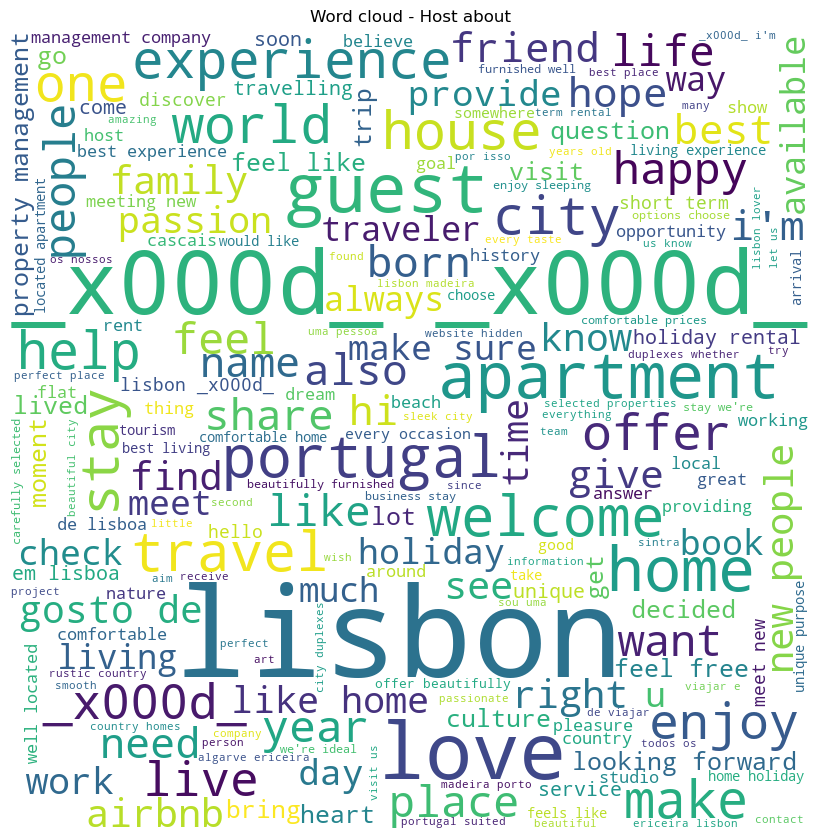

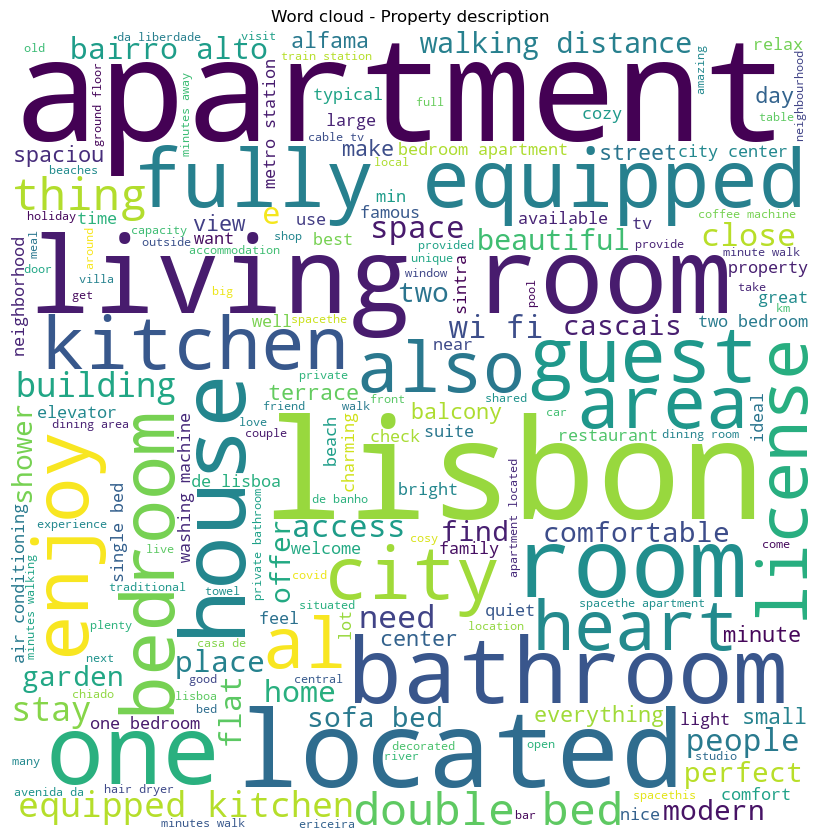

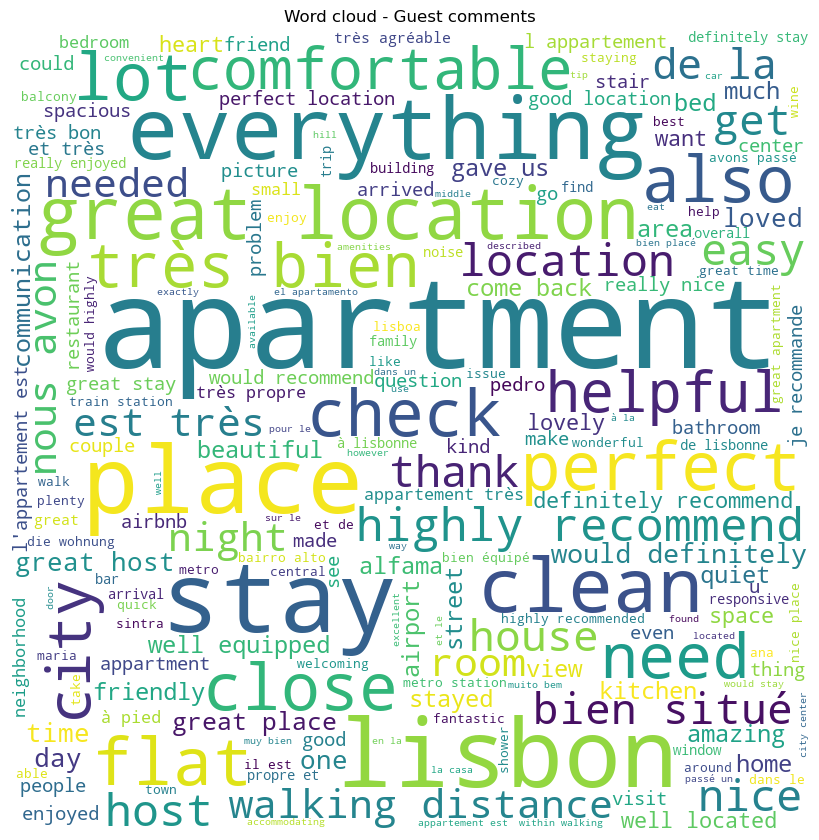

In [ ]:
if dicSteps2Perform['05. Further exploration']:
	plot_wordcloud(train_df['host_about'], "Host about")
	plot_wordcloud(train_df['description'], "Property description")
	plot_wordcloud(train_reviews_df['comments'], "Guest comments")


## REVIEW BELOW THIS POINT UNTIL THE END OF TOPIC 5 (Data exploration after initial transformations and language detection)

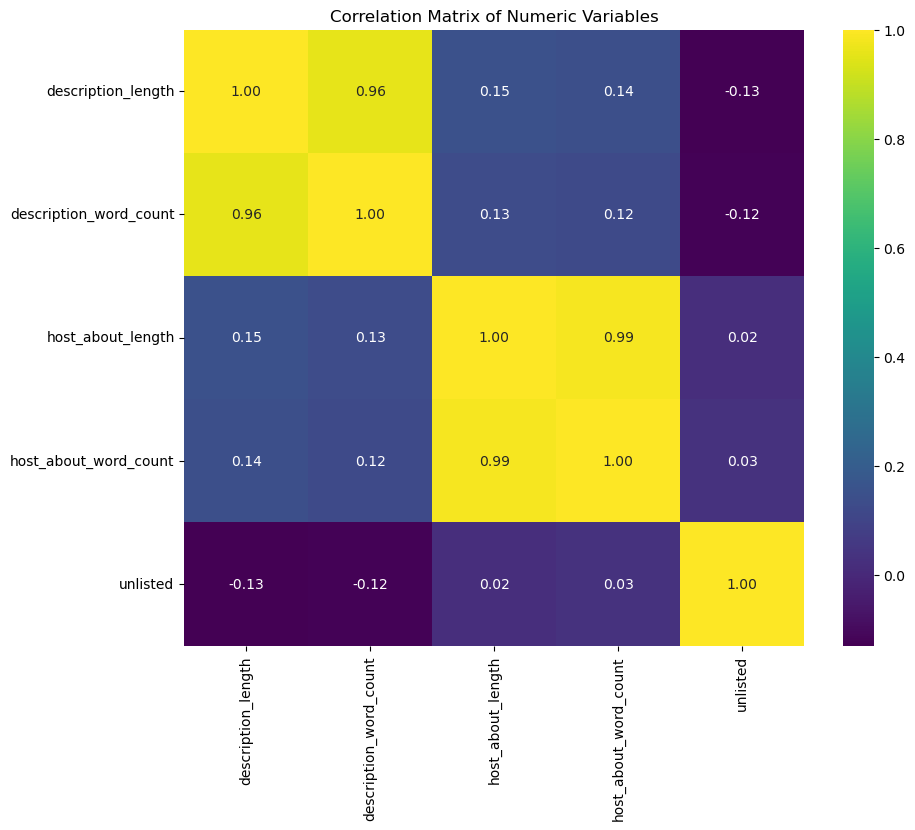

In [ ]:
if dicSteps2Perform['05. Further exploration']:
    numeric_columns = ['description_length', 'description_word_count', 'host_about_length', 'host_about_word_count', 'unlisted']

    # Selecting numeric columns
    numeric_df = train_df[numeric_columns]

    # Compute correlation matrix
    correlation_matrix = numeric_df.corr()

    # Plot correlation matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt=".2f",
                xticklabels=correlation_matrix.columns, yticklabels=correlation_matrix.columns)
    plt.title('Correlation Matrix of Numeric Variables')
    plt.show()

In [ ]:
if dicSteps2Perform['05. Further exploration']:
	print(train_reviews_df["comments_lang"].unique())


['en' 'so' 'de' 'cs' 'fr' 'es' 'pt' 'ru' 'it' 'nl' 'ko' 'zh-cn' 'he' None
 'af' 'pl' 'no' 'ca' 'da' 'sq' 'ro' 'hr' 'ja' 'zh-tw' 'tr' 'sk' 'ar' 'tl'
 'sv' 'sw' 'lv' 'hu' 'el' 'sl' 'fi' 'et' 'cy' 'id' 'uk' 'lt' 'vi' 'mk'
 'bg' 'ur']


In [ ]:
if dicSteps2Perform['05. Further exploration']:
	fig = px.histogram(train_reviews_df, x="comments_lang")
	fig.update_layout(xaxis_title="comments_lang", yaxis_title="Frequency")
	fig.show()


In [ ]:
# Sorting languages by comments
if dicSteps2Perform['05. Further exploration']:
    comment_lang = (
        train_reviews_df.groupby(by="comments_lang")
        .count()
        .sort_values(by="comments", ascending=False)[["comments"]]
    )

In [ ]:
if dicSteps2Perform['05. Further exploration']:
	fig = px.bar(y=comment_lang["comments"], x=comment_lang.index)
	fig.update_layout(xaxis_title="Language", yaxis_title="Frequency")
	fig.show()


In [ ]:
if dicSteps2Perform['05. Further exploration']:
	# Show top 20 comments
	print(comment_lang.head(20))

               comments
comments_lang          
en               231216
fr                53514
pt                22493
es                19348
de                13847
it                 5845
nl                 3589
ru                 1508
ko                 1469
ro                 1135
zh-cn              1038
ca                  726
pl                  630
da                  490
af                  412
sv                  387
no                  370
cs                  348
so                  263
fi                  200


In [ ]:
# Get all stop words
def get_all_stopwords():
    languages = stopwords.fileids()
    stop_words = set()
    for lang in languages:
        stop_words.update(stopwords.words(lang))
    return stop_words

In [ ]:
# Function to plot top non-stop words
def plot_top_non_stopwords_barchart(text):
    stop = get_all_stopwords()

    # Convert to string type and split the text
    new = text.astype(str).str.split()
    new = new.values.tolist()
    corpus = [word for i in new for word in i]

    counter = Counter(corpus)
    most = counter.most_common()
    x, y = [], []
    for word, count in most[:40]:
        if word.lower() not in stop:
            x.append(word)
            y.append(count)

    plt.figure(figsize=(10, 8))
    sns.barplot(x=y, y=x)
    plt.title('Top Non-Stop Words')
    plt.xlabel('Frequency')
    plt.ylabel('Words')
    plt.show()

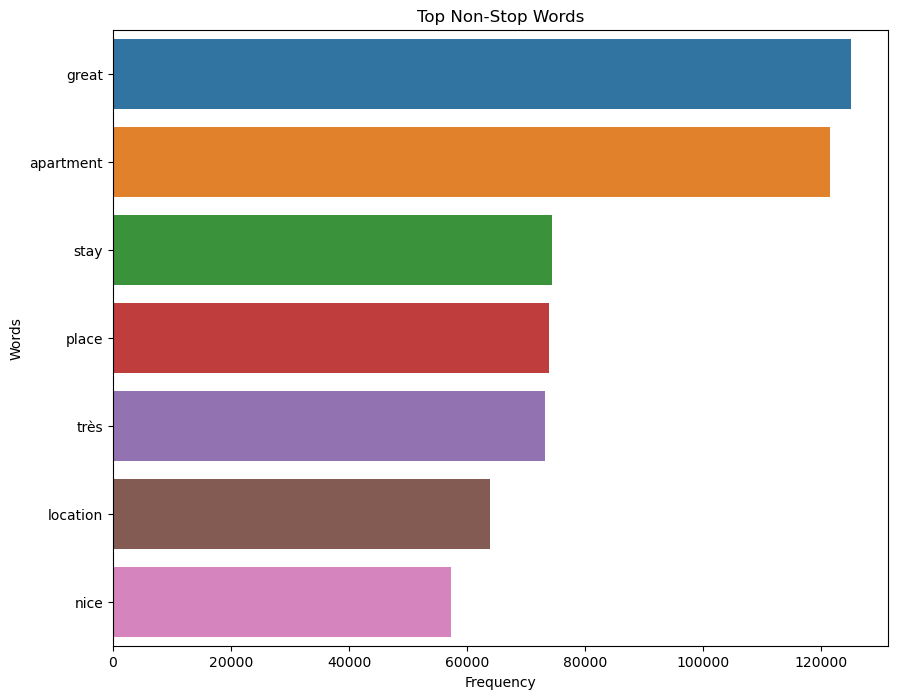

In [ ]:
if dicSteps2Perform['05. Further exploration']:
	plot_top_non_stopwords_barchart(train_reviews_df['comments'])

In [ ]:
if dicSteps2Perform['05. Further exploration']:
    # Join the training dataset by index. We are only adding the reviews and target column

    # train_df_new = train_reviews_df[["comments"]].merge(
    #     train_df["unlisted"], "right", left_index=True, right_index=True
    # )
    pass


In [ ]:
if dicSteps2Perform['05. Further exploration']:
	# Save train_df_new as a CSV file
	# file_name = 'train_df_new.csv'
	# train_df_new.to_csv(file_name, index=False)

	# # Provide a link to download the CSV file
	# from google.colab import files
	# files.download(file_name)
	pass


In [ ]:
## No need to save fiels, as no transformations are performed in this section


# **06. Language-specific processing**

## Open the files created in the previous processing

In [ ]:
if dicSteps2Perform['06. Language-specific processing']:

	prefix = varPath + 'langdet_'
	train_df = pd.read_parquet(prefix + 'train.parquet')
	train_reviews_df = pd.read_parquet(prefix + 'train_reviews.parquet')
	test_df = pd.read_parquet(prefix + 'test.parquet')
	test_reviews_df = pd.read_parquet(prefix + 'test_reviews.parquet')


## Define all functions that will be used for processing

In [ ]:
nltk.download('wordnet')

# Handling stopwords
nltk.download('stopwords')


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Funskill\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Funskill\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
# Dealing with emojis

def replace_emojis_with_meanings(text):
    if isinstance(text, int):
        text = str(text)

    # Function to replace emoji with its meaning
    def replace_if_emoji(word):
        return emoji.demojize(word).replace(":", "").replace("_", " ").title() if emoji.is_emoji(word) else word

    # Process each word in the text
    words = text.split()
    replaced_words = [replace_if_emoji(word) for word in words]

    return " ".join(replaced_words)


In [ ]:
# Tokenization Function

def tokenization(column):
    # Tokenize the comments at the word level
    new_column = column.fillna('').astype(str).apply(lambda x: word_tokenize(x))

    return new_column

In [ ]:
# Punctuation Function

def punctuation(column_tokenized):
    exclude = set(string.punctuation)

    # Remove punctuation from the comments
    column_tokenized = column_tokenized.apply(lambda x: [re.sub("[^a-zA-Z]"," ", word) for word in x])
     # Separate phrases into individual words
    column_tokenized = column_tokenized.apply(lambda x: [word for phrase in x for word in phrase.split()])
    # Remove the empty strings and spaces after words
    column_tokenized = column_tokenized.apply(lambda x: [word.strip() for word in x if word.strip()])

    return column_tokenized


In [ ]:
# Remove strings that are not words

def remove_non_word_strings(data):
    cleaned_data = []
    for token_list in data:
        cleaned_phrase = [word for word in token_list if word.isalpha()]
        cleaned_data.append(cleaned_phrase)
    return cleaned_data

In [ ]:
# Get all stop words
def get_all_stopwords():
    languages = stopwords.fileids()
    stop_words = set()
    for lang in languages:
        stop_words.update(stopwords.words(lang))
    return stop_words

# Remove stopwords function

def remove_stopwords(column_text):
    stop = get_all_stopwords()
    no_stop_words = column_text.apply(lambda x: [word for word in x if word.lower() not in stop])
    return no_stop_words

In [ ]:

# Lemmatization Function

def lemmatize_comments(tokenized_comments):
    lemmatizer = WordNetLemmatizer()
    lemmatized_comments = []
    for comment in tokenized_comments:
        lemmatized_words = [lemmatizer.lemmatize(word) for word in comment]
        lemmatized_comments.append(lemmatized_words)
    return lemmatized_comments

## Call the functions on the attributes of the dataframes, to perform the conversions


In [ ]:
if dicSteps2Perform['06. Language-specific processing']:
	train_df["description"] = train_df['description'].apply(replace_emojis_with_meanings)
	train_df["host_about"] =train_df['host_about'].apply(replace_emojis_with_meanings)
	train_reviews_df['comments'] = train_reviews_df['comments'].apply(replace_emojis_with_meanings)
	test_df["description"] = test_df['description'].apply(replace_emojis_with_meanings)
	test_df["host_about"] = test_df['host_about'].apply(replace_emojis_with_meanings)
	test_reviews_df["comments"] = test_reviews_df['comments'].apply(replace_emojis_with_meanings)

In [ ]:
if dicSteps2Perform['06. Language-specific processing']:
	train_df["description"] = tokenization(train_df['description'])
	train_df["host_about"] =tokenization(train_df['host_about'])
	train_reviews_df["comments"] = tokenization(train_reviews_df['comments'])
	test_df["description"] = tokenization(test_df['description'])
	test_df["host_about"] = tokenization(test_df['host_about'])
	test_reviews_df["comments"] = tokenization(test_reviews_df['comments'])


In [ ]:
if dicSteps2Perform['06. Language-specific processing']:
	train_df["description"] = punctuation(train_df['description'])
	train_df["host_about"] =punctuation(train_df['host_about'])
	train_reviews_df["comments"] = punctuation(train_reviews_df['comments'])
	test_df["description"] = punctuation(test_df['description'])
	test_df["host_about"] = punctuation(test_df['host_about'])
	test_reviews_df["comments"] = punctuation(test_reviews_df['comments'])

In [ ]:
if dicSteps2Perform['06. Language-specific processing']:
	train_df["description"] = remove_non_word_strings(train_df['description'])
	train_df["host_about"] =remove_non_word_strings(train_df['host_about'])
	train_reviews_df["comments"] = remove_non_word_strings(train_reviews_df['comments'])
	test_df["description"] = remove_non_word_strings(test_df['description'])
	test_df["host_about"] = remove_non_word_strings(test_df['host_about'])
	test_reviews_df["comments"] = remove_non_word_strings(test_reviews_df['comments'])

In [ ]:
if dicSteps2Perform['06. Language-specific processing']:
	train_df["description"] = remove_stopwords(train_df['description'])
	train_df["host_about"] =remove_stopwords(train_df['host_about'])
	train_reviews_df["comments"] = remove_stopwords(train_reviews_df['comments'])
	test_df["description"] = remove_stopwords(test_df['description'])
	test_df["host_about"] = remove_stopwords(test_df['host_about'])
	test_reviews_df["comments"] = remove_stopwords(test_reviews_df['comments'])

In [ ]:
if dicSteps2Perform['06. Language-specific processing']:
	train_df["description"] = lemmatize_comments(train_df['description'])
	train_df["host_about"] =lemmatize_comments(train_df['host_about'])
	train_reviews_df["comments"] = lemmatize_comments(train_reviews_df['comments'])
	test_df["description"] = lemmatize_comments(test_df['description'])
	test_df["host_about"] = lemmatize_comments(test_df['host_about'])
	test_reviews_df["comments"] = lemmatize_comments(test_reviews_df['comments'])

NameError: name 'dicSteps2Perform' is not defined

In [ ]:
print(train_df['description'])

NameError: name 'train_df' is not defined

In [ ]:
train_df()

NameError: name 'train_df' is not defined

## Save transformed dataframes to disk

In [ ]:
if dicSteps2Perform['06. Language-specific processing']:

	prefix = varPath + 'finalprepr_'
	train_df.to_parquet(prefix + 'train.parquet')
	train_reviews_df.to_parquet(prefix + 'train_reviews.parquet')
	test_df.to_parquet( prefix + 'test.parquet')
	test_reviews_df.to_parquet( prefix + 'test_reviews.parquet')

## Merge Host and Reviews Dataframe

In [ ]:
prefix = varPath + 'finalprepr_'
train_df = pd.read_parquet(prefix + 'train.parquet')
train_reviews_df = pd.read_parquet(prefix + 'train_reviews.parquet')
test_df = pd.read_parquet(prefix + 'test.parquet')
test_reviews_df = pd.read_parquet(prefix + 'test_reviews.parquet')

In [ ]:
train_df["string_description"] = train_df['description'].apply(lambda x: ' '.join(x))
train_df["string_host"] = train_df['host_about'].apply(lambda x: ' '.join(x))
train_reviews_df["string_comment"] = train_reviews_df['comments'].apply(lambda x: ' '.join(x))
train_reviews_df = train_reviews_df.groupby('index')['string_comment'].agg(lambda x: ' '.join(x))
train_df = train_df.join(train_reviews_df, on='index')

test_df["string_description"] = test_df['description'].apply(lambda x: ' '.join(x))
test_df["string_host"] = test_df['host_about'].apply(lambda x: ' '.join(x))
test_reviews_df["string_comment"] = test_reviews_df['comments'].apply(lambda x: ' '.join(x))
test_reviews_df = test_reviews_df.groupby('index')['string_comment'].agg(lambda x: ' '.join(x))
test_df = test_df.join(test_reviews_df, on='index')

In [ ]:
# Fill missing values with None
train_df['string_description'] = train_df['string_description'].fillna('')
train_df['string_host'] = train_df['string_host'].fillna('')
train_df['string_comment'] = train_df['string_comment'].fillna('')

test_df['string_description'] = test_df['string_description'].fillna('')
test_df['string_host'] = test_df['string_host'].fillna('')
test_df['string_comment'] = test_df['string_comment'].fillna('')

In [ ]:
# Combine Texts
train_df['combined_text'] = train_df['string_description'] + ' ' + train_df['string_host'] + ' ' + train_df['string_comment']
test_df['combined_text'] = test_df['string_description'] + ' ' + test_df['string_host'] + ' ' + test_df['string_comment']

## Save Combined Dataframe

In [ ]:
prefix = varPath + 'combined_'
train_df.to_parquet(prefix + 'train.parquet')
test_df.to_parquet( prefix + 'test.parquet')

# **07. Representation**
# *Represented in the transformation ipynb file*

In [ ]:
if dicSteps2Perform['07. Representation']:
	prefix = varPath + 'merged_'
	train_df = pd.read_parquet(prefix + 'train.parquet')
	test_df = pd.read_parquet(prefix + 'test.parquet')

In [ ]:
# TF-IDF, Glove, DistilBert, DistilUse


# **08. Classification**

## Training Model with TFIDF Transformation

In [34]:
train_df = pd.read_parquet('/content/drive/MyDrive/Text Mining Dataset/Project Corpora/tfidf_train.parquet')

# **Feature Selection**

In [22]:
# Select metadata features
metadata_features = [
    'description_length',
    'description_word_count',
    'host_about_length',
    'host_about_word_count',
    'description_lang',
    'host_about_lang'
]

# Select tfidf features from column 15 to the end
tfidf_features = train_df.iloc[:, 15:5013]

# One-hot encode categorical metadata features
train_df_encoded = pd.get_dummies(train_df[metadata_features])

# Combine one-hot encoded metadata features and tfidf features
features = train_df_encoded.join(tfidf_features)

# Separate feature from target variables
X = features
y = train_df['unlisted']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

**Run Support Vector Machine, Random Forest and Logistic Regression**

In [55]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# SVM Model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# Random Forest Model
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

# Logistic Regression Model with increased iterations and different solver
logistic_model = LogisticRegression(max_iter=1000, solver='saga')
logistic_model.fit(X_train, y_train)

# Evaluate models
svm_pred = svm_model.predict(X_test)
rf_pred = rf_model.predict(X_test)
logistic_pred = logistic_model.predict(X_test)

# Classification Reports
svm_classification_report = classification_report(y_test, svm_pred)
rf_classification_report = classification_report(y_test, rf_pred)
logistic_classification_report = classification_report(y_test, logistic_pred)

print("SVM Classification Report:")
print(svm_classification_report)

print("Random Forest Classification Report:")
print(rf_classification_report)

print("Logistic Regression Classification Report:")
print(logistic_classification_report)

# Save the best model (Random Forest)
joblib.dump(rf_model, 'best_rf_model.pkl')
print("Random Forest model saved as 'best_rf_model.pkl'")

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


SVM Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.89      0.91       905
           1       0.74      0.82      0.78       345

    accuracy                           0.87      1250
   macro avg       0.84      0.86      0.84      1250
weighted avg       0.88      0.87      0.87      1250

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.89      0.91       905
           1       0.74      0.80      0.77       345

    accuracy                           0.87      1250
   macro avg       0.83      0.84      0.84      1250
weighted avg       0.87      0.87      0.87      1250

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       905
           1       0.73      0.73      0.73       345

    accuracy                           0.85      1250
   macro avg       0.

## **Training Model with DistilBert Transformation**

In [6]:
train_df = pd.read_parquet('/content/drive/MyDrive/Text Mining Dataset/Project Corpora/distilbert_train.parquet')
test_df = pd.read_parquet('/content/drive/MyDrive/Text Mining Dataset/Project Corpora/distilbert_test.parquet')

***Feature Selection***

In [10]:
# Feature Selection
metadata_features = [
    'description_length',
    'description_word_count',
    'host_about_length',
    'host_about_word_count',
    'description_lang',
    'host_about_lang'
]

# Select BERT features from column 15 to the end
bert_features = train_df.iloc[:, 15:782]

# One-hot encode categorical metadata features
train_df_encoded = pd.get_dummies(train_df[metadata_features])

# Combine one-hot encoded metadata features and BERT features
features_train = train_df_encoded.join(bert_features)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(features_train)

# Save the one-hot encoded columns and the scaler
encoded_columns = list(train_df_encoded.columns)
joblib.dump(encoded_columns, 'encoded_columns.pkl')
joblib.dump(scaler, 'scaler.pkl')

# Separate features and target variable
X_train = X_train_scaled
y_train = train_df['unlisted']

# Split data into training and test sets (assuming this step is done previously)
X_train, X_test, y_train, y_test = train_test_split(X_train_scaled, y_train, test_size=0.2, random_state=42)

***Train the Model***

In [11]:
# Train models
svm_model = SVC()
svm_model.fit(X_train, y_train)

rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

logistic_model = LogisticRegression(max_iter=1000, solver='saga')
logistic_model.fit(X_train, y_train)

# Evaluate models
svm_pred = svm_model.predict(X_test)
rf_pred = rf_model.predict(X_test)
logistic_pred = logistic_model.predict(X_test)

# Classification Reports
svm_classification_report = classification_report(y_test, svm_pred)
rf_classification_report = classification_report(y_test, rf_pred)
logistic_classification_report = classification_report(y_test, logistic_pred)

print("SVM Classification Report:")
print(svm_classification_report)

print("Random Forest Classification Report:")
print(rf_classification_report)

print("Logistic Regression Classification Report:")
print(logistic_classification_report)

# Save the best model (SVM in this case)
joblib.dump(svm_model, 'best_svm_model.pkl')
print("SVM Model saved as 'best_svm_model.pkl'")


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


SVM Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.89      0.91       905
           1       0.74      0.82      0.78       345

    accuracy                           0.87      1250
   macro avg       0.84      0.86      0.84      1250
weighted avg       0.88      0.87      0.87      1250

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.89      0.91       905
           1       0.74      0.80      0.77       345

    accuracy                           0.87      1250
   macro avg       0.83      0.84      0.84      1250
weighted avg       0.87      0.87      0.87      1250

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       905
           1       0.73      0.73      0.73       345

    accuracy                           0.85      1250
   macro avg       0.

## **Training Model with DistilUse Transformation**

In [26]:
train_df = pd.read_parquet('/content/drive/MyDrive/Text Mining Dataset/Project Corpora/distiluse_train.parquet')
test_df = pd.read_parquet('/content/drive/MyDrive/Text Mining Dataset/Project Corpora/distiluse_test.parquet')

***Feature Selection***

In [32]:
# Select metadata features
metadata_features = [
    'description_length',
    'description_word_count',
    'host_about_length',
    'host_about_word_count',
    'description_lang',
    'host_about_lang'
]

# Select bert features from column 15 to the end
distiluse_features = train_df.iloc[:, 15:526]

# One-hot encode categorical metadata features
train_df_encoded = pd.get_dummies(train_df[metadata_features])

# Combine one-hot encoded metadata features and bert features
features = train_df_encoded.join(distiluse_features)

# Separate feature from target variables
X = features
y = train_df['unlisted']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [33]:
# SVM Model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# Random Forest Model
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

# Logistic Regression Model with increased iterations and different solver
logistic_model = LogisticRegression(max_iter=1000, solver='saga')
logistic_model.fit(X_train, y_train)

# Evaluate models
svm_pred = svm_model.predict(X_test)
rf_pred = rf_model.predict(X_test)
logistic_pred = logistic_model.predict(X_test)

# Classification Reports
svm_classification_report = classification_report(y_test, svm_pred)
rf_classification_report = classification_report(y_test, rf_pred)
logistic_classification_report = classification_report(y_test, logistic_pred)

print("SVM Classification Report:")
print(svm_classification_report)

print("Random Forest Classification Report:")
print(rf_classification_report)

print("Logistic Regression Classification Report:")
print(logistic_classification_report)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


SVM Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.96      0.88       905
           1       0.80      0.40      0.53       345

    accuracy                           0.81      1250
   macro avg       0.80      0.68      0.70      1250
weighted avg       0.81      0.81      0.78      1250

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.96      0.87       905
           1       0.77      0.37      0.50       345

    accuracy                           0.80      1250
   macro avg       0.79      0.66      0.68      1250
weighted avg       0.79      0.80      0.77      1250

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.91      0.86       905
           1       0.65      0.46      0.54       345

    accuracy                           0.78      1250
   macro avg       0.

**Evaluation**

Considering the balance between precision, recall, and F1-score for both classes, the SVM appears to be the best model. It has the highest overall accuracy (0.81) and a strong F1-score for the majority class (0.88). Despite having a lower recall for the minority class, its precision (0.80) and F1-score (0.53) are competitive.

# **Predictions with Test Data**

In [12]:
test_df = pd.read_parquet('/content/drive/MyDrive/Text Mining Dataset/Project Corpora/distilbert_test.parquet')

**Feature Selection**

In [13]:
# Ensure the same transformations are applied to the test data
metadata_features = [
    'description_length',
    'description_word_count',
    'host_about_length',
    'host_about_word_count',
    'description_lang',
    'host_about_lang'
]

# Select BERT features from column 14 to the end
bert_features = test_df.iloc[:, 14:781]

# One-hot encode categorical metadata features
test_df_encoded = pd.get_dummies(test_df[metadata_features])

# Ensure the test set has the same one-hot encoded columns as the training set
# Load the column names of the encoded training data (assuming this was saved previously)
encoded_columns = joblib.load('encoded_columns.pkl')  # Save this during training

# Add missing columns in the test set with zeros
for column in encoded_columns:
    if column not in test_df_encoded.columns:
        test_df_encoded[column] = 0

# Remove any extra columns that are not in the training set
test_df_encoded = test_df_encoded[encoded_columns]

# Combine one-hot encoded metadata features and BERT features
features_test = test_df_encoded.join(bert_features)

# Load the scaler fitted on the training data
scaler = joblib.load('scaler.pkl')  # Ensure you save this scaler during training
X_test_scaled = scaler.transform(features_test)

# Store the index, host_about, and description for later use
index = test_df.index
description = test_df['description']
host_about = test_df['host_about']

**Predict with Best Model**

In [14]:
# Load the saved model
svm_model = joblib.load('best_svm_model.pkl')

# Make predictions on the preprocessed test data
predictions = svm_model.predict(X_test_scaled)

# Create a DataFrame with the required columns
output = pd.DataFrame({
    'Index': index,
    'Description': description,
    'Host_About': host_about,
    'Predictions_Unlisted': predictions
})

# Save predictions to a CSV file
output.to_csv('predictions.csv', index=False)

print("Predictions saved to predictions.csv")

Predictions saved to predictions.csv


In [15]:
output.head()

,Index,Description,Host_About,Predictions_Unlisted
0,0,"[spaceapartment, located, historic, center, li...","[gosto, viajar, conhecer, pessoas, gosto, rece...",0
1,1,"[important, response, covid, property, extende...","[home, team, count, single, detail, guarantee,...",0
2,2,"[bright, beautiful, spacious, bedroom, apartme...","[guestready, professional, property, managemen...",1
3,3,"[charming, apartment, close, bay, cascais, bed...",[],0
4,4,"[procura, uma, f, rias, perto, praia, casino, ...","[bem, vindos, portugal, x, adoro, tamb, adoro,...",0


**Save Predictions**

In [16]:
prefix = varPath + 'predictions_'
output.to_csv(prefix + 'predictions.csv', index=False)

# **99. End**

In [ ]:
# The end